In [1]:
import os
import sys
import numpy as np
import pandas as pd 
from tqdm.notebook import tqdm
import json


sys.path.insert(0, '../')
from scripts.tracking import TeamTracking 


In [38]:
import os
import json
import pandas as pd
import numpy as np
import tensorflow as tf
import random
import matplotlib.pyplot as plt
from mplsoccer import Pitch
from tqdm.notebook import tqdm

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense, ReLU, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint, TerminateOnNaN, ReduceLROnPlateau, EarlyStopping, CSVLogger
import shap
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import timedelta

In [6]:
match_tracking_path

'../data/SecondSpectrum\\g2312101_SecondSpectrum_tracking-produced.jsonl'

In [6]:
data_directory = '../data/SecondSpectrum'
file = 'g2312101_SecondSpectrum_tracking-produced.jsonl'
match_tracking_path = os.path.join(data_directory, file)

# < 20s
df_unstructured_tracking = pd.read_json("../data/g2312201_SecondSpectrum_tracking-produced.jsonl", lines = True)

In [25]:
HomeTracking = TeamTracking(df_unstructured_tracking=df_unstructured_tracking)

In [14]:
%ls "../data"

 Le volume dans le lecteur C s'appelle Windows
 Le num‚ro de s‚rie du volume est 3809-5E8D

 R‚pertoire de C:\Users\tchassard\PycharmProjects\hackaton_man_city\ManHackathonIrsem\data

02/04/2023  20:59    <DIR>          .
02/04/2023  20:59    <DIR>          ..
30/03/2023  17:22             8ÿ901 g2312201_SecondSpectrum_meta.json
30/03/2023  17:22               440 g2312201_SecondSpectrum_meta.xml
30/03/2023  17:22            37ÿ341 g2312201_SecondSpectrum_physical-splits.csv
30/03/2023  17:22             5ÿ284 g2312201_SecondSpectrum_physical-summary.csv
30/03/2023  17:26       442ÿ388ÿ547 g2312201_SecondSpectrum_tracking-produced.jsonl
30/03/2023  17:25       441ÿ764ÿ291 g2312201_SecondSpectrum_tracking-produced.xml
30/03/2023  17:23         3ÿ676ÿ056 ManCity_AstonVilla_events.json
30/03/2023  17:23         4ÿ367ÿ871 ManCity_Brighton_events.json
30/03/2023  17:23         3ÿ394ÿ786 ManCity_Liverpool_events.json
30/03/2023  17:23         4ÿ163ÿ331 ManCity_Tottenham_events.json
         

In [24]:
df_unstructured_events = pd.read_json("../data/ManCity_AstonVilla_events.json")

In [36]:
df_unstructured_events['pass']

0                                                     NaN
1                                                     NaN
2                                                     NaN
3                                                     NaN
4       {'recipient': {'id': 15562, 'name': 'Lucy Stan...
                              ...                        
3387                                                  NaN
3388    {'length': 65.510994, 'angle': 0.4131096999999...
3389                                                  NaN
3390                                                  NaN
3391                                                  NaN
Name: pass, Length: 3392, dtype: object

In [37]:
df_unstructured_events.iloc[3388]

id                                 a642ae04-9d98-4cbd-9671-85a822eed309
index                                                              3389
period                                                                2
timestamp                                    2023-04-02 00:47:58.145000
minute                                                               92
second                                                               58
type                                         {'id': 30, 'name': 'Pass'}
possession                                                          205
possession_team                     {'id': 2647, 'name': 'Aston Villa'}
play_pattern                        {'id': 7, 'name': 'From Goal Kick'}
obv_for_after                                                       NaN
obv_for_before                                                      NaN
obv_for_net                                                         NaN
obv_against_after                                               

In [38]:
df_unstructured_events['pass'][3388]

{'length': 65.510994,
 'angle': 0.41310969999999997,
 'height': {'id': 3, 'name': 'High Pass'},
 'end_location': [67.0, 70.4],
 'body_part': {'id': 40, 'name': 'Right Foot'},
 'type': {'id': 63, 'name': 'Goal Kick'},
 'outcome': {'id': 9, 'name': 'Incomplete'}}

### Based on simple model by Paul Minogue : https://paulminogue.com/posts/8e4e1914-4cd9-4a0f-9cf0-9dbf3c47e1ce 
#### "Building a simple expected pass completion (xP) model using Keras"

#### Test with man city data first 

In [31]:
event_data_dir = '../data/events'
pass_data = []

# iterate through each file in the events data directory and pull each event if it is a passing event
for filename in tqdm(os.listdir(event_data_dir)):
    if filename.endswith(".json"): 
        with open(os.path.join(event_data_dir, filename)) as json_file:
            match_id = int(filename[-6])
            data = json.load(json_file)
            for event in data:
                if event.get('type', {}).get('name', None) == 'Pass':
                    pass_data.append(
                        {
                            'match_id': match_id,
                            'event_id': event['id'],
                            'timestamp': event['timestamp'],
                            'period' : event['period'],
                            'passing_team': event.get('possession_team', {}).get('name', None),
                            'recipient_name': event.get('pass', {}).get('recipient', {}).get('name', None),
                            'passing_player': event.get('player', {}).get('name', None),
                            'passing_player_x_location': event['location'][0],
                            'passing_player_y_location': event['location'][1],
                            'pass_end_location_x': event.get('pass', {})['end_location'][0],
                            'pass_end_location_y': event.get('pass', {})['end_location'][1],
                            'pass_height_category': event.get('pass', {}).get('height', {}).get('name', None),
                            'body_part': event.get('pass', {}).get('body_part', {}).get('name', None),
                            'outcome': event.get('pass', {}).get('outcome', {}).get('name', None)
                        }
                    )
# Note that "None" outcome means complete
pass_df = pd.DataFrame(pass_data)
pass_df.head()

  0%|          | 0/4 [00:00<?, ?it/s]

,match_id,event_id,timestamp,period,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,00:00:00.250,1,Aston Villa,Lucy Staniforth,Rachel Daly,60.0,40.0,49.8,38.5,Ground Pass,Right Foot,None
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,00:00:02.056,1,Aston Villa,Mayumi Pacheco,Lucy Staniforth,48.4,35.9,40.3,19.0,Ground Pass,Right Foot,None
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,00:00:04.507,1,Aston Villa,Danielle Turner,Mayumi Pacheco,39.7,18.7,30.2,22.1,Ground Pass,Left Foot,None
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,00:00:07.681,1,Aston Villa,Anna Patten,Danielle Turner,28.0,25.5,23.5,53.6,Ground Pass,Left Foot,None
4,2,32629e9e-92ae-4184-abec-bbc050519402,00:00:11.728,1,Aston Villa,Danielle Turner,Anna Patten,28.7,57.8,26.6,30.5,Ground Pass,Right Foot,None


In [104]:
event

{'id': '015936e4-e736-4324-9123-1fcd65e940f3',
 'index': 3777,
 'period': 2,
 'timestamp': '00:50:44.075',
 'minute': 95,
 'second': 44,
 'type': {'id': 34, 'name': 'Half End'},
 'possession': 192,
 'possession_team': {'id': 746, 'name': 'Manchester City WFC'},
 'play_pattern': {'id': 7, 'name': 'From Goal Kick'},
 'obv_for_after': None,
 'obv_for_before': None,
 'obv_for_net': None,
 'obv_against_after': None,
 'obv_against_before': None,
 'obv_against_net': None,
 'obv_total_net': None,
 'team': {'id': 749, 'name': 'Tottenham Hotspur Women'},
 'duration': 0.0,
 'related_events': ['ba886cad-9adc-4e1f-8d36-e32693e231e5']}

In [105]:
event_data_dir = '../data/events'
pass_timestamp = []

# iterate through each file in the events data directory and pull each event if it is a passing event
for filename in tqdm(os.listdir(event_data_dir)):
    if filename.endswith(".json"): 
        with open(os.path.join(event_data_dir, filename)) as json_file:
            match_id = int(filename[-6])
            data = json.load(json_file)
            for event in data:
                if event.get('type', {}).get('name', None) == 'Pass':
                    pass_timestamp.append(
                        {
                            'match_id': match_id,
                            'event_id': event['id'],
                            'timestamps': event['timestamp']
                        }
                    )
# Note that "None" outcome means complete
pass_df_time = pd.DataFrame(pass_timestamp)
pass_df_time.head()

  0%|          | 0/4 [00:00<?, ?it/s]

,match_id,event_id,timestamps
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,00:00:00.250
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,00:00:02.056
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,00:00:04.507
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,00:00:07.681
4,2,32629e9e-92ae-4184-abec-bbc050519402,00:00:11.728


In [106]:
pass_df_time

,match_id,event_id,timestamps
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,00:00:00.250
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,00:00:02.056
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,00:00:04.507
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,00:00:07.681
4,2,32629e9e-92ae-4184-abec-bbc050519402,00:00:11.728
...,...,...,...
3885,4,1769d59f-1ba9-42b9-9b6c-f902969979a2,00:50:11.174
3886,4,f58c8eee-27e4-445e-8a38-73c44c9375a3,00:50:12.724
3887,4,638f857d-41b8-4ff2-a6ef-c08514c17a18,00:50:38.836
3888,4,c33b1ed4-5f74-4058-b0cc-140feaba7c06,00:50:40.943


In [9]:
pass_df

,match_id,event_id,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,Aston Villa,Lucy Staniforth,Rachel Daly,60.0,40.0,49.8,38.5,Ground Pass,Right Foot,None
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,Aston Villa,Mayumi Pacheco,Lucy Staniforth,48.4,35.9,40.3,19.0,Ground Pass,Right Foot,None
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,Aston Villa,Danielle Turner,Mayumi Pacheco,39.7,18.7,30.2,22.1,Ground Pass,Left Foot,None
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,Aston Villa,Anna Patten,Danielle Turner,28.0,25.5,23.5,53.6,Ground Pass,Left Foot,None
4,2,32629e9e-92ae-4184-abec-bbc050519402,Aston Villa,Danielle Turner,Anna Patten,28.7,57.8,26.6,30.5,Ground Pass,Right Foot,None
...,...,...,...,...,...,...,...,...,...,...,...,...
3885,4,1769d59f-1ba9-42b9-9b6c-f902969979a2,Tottenham Hotspur Women,Angharad James,So-Hyun Cho,82.4,51.1,91.4,53.0,Ground Pass,Right Foot,None
3886,4,f58c8eee-27e4-445e-8a38-73c44c9375a3,Tottenham Hotspur Women,Celin Bizet IldhusÃ¸y,Angharad James,90.3,53.4,99.1,58.3,Ground Pass,Right Foot,None
3887,4,638f857d-41b8-4ff2-a6ef-c08514c17a18,Manchester City WFC,Esme Beth Morgan,Ellie Roebuck,7.0,44.1,7.7,58.6,Ground Pass,Left Foot,None
3888,4,c33b1ed4-5f74-4058-b0cc-140feaba7c06,Manchester City WFC,Ellie Roebuck,Esme Beth Morgan,9.9,58.6,5.0,45.5,Ground Pass,Right Foot,None


In [32]:
# Step 1: remove pass events we don't want
modelling_df = pass_df.loc[
    ~pass_df['outcome'].isin(['Injury Clearance', 'Pass Offside', 'Unknown'])
]

# Step 2: create one hot variables
# pass height and body part
one_hot_pass_height_variables = pd.get_dummies(modelling_df['pass_height_category'])
one_hot_body_part_variables = pd.get_dummies(modelling_df['body_part'])

# tidies up naming before appending row wise
one_hot_pass_height_variables.columns = [
    col.lower().replace(' ', '_') for col in one_hot_pass_height_variables.columns
]
one_hot_body_part_variables.columns = [
    col.lower().replace(' ', '_') for col in one_hot_body_part_variables.columns
]

modelling_df = pd.concat([modelling_df, one_hot_pass_height_variables], axis=1)
modelling_df = pd.concat([modelling_df, one_hot_body_part_variables], axis=1)

# Step 3: create binary pass complete column
modelling_df['completed'] = 0
modelling_df.loc[modelling_df['outcome'].isna(), 'completed'] = 1

# Step 4: finally filter down to the columns we want
modelling_cols = (
    [
        'event_id',
        'passing_player_x_location', 
        'passing_player_y_location', 
        'pass_end_location_x',
        'pass_end_location_y'
    ] + 
    list(one_hot_pass_height_variables.columns) +
    list(one_hot_body_part_variables.columns) + 
    ['completed']
)

modelling_df = modelling_df[modelling_cols]

In [33]:
modelling_df

,event_id,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,ground_pass,high_pass,low_pass,drop_kick,head,keeper_arm,left_foot,no_touch,other,right_foot,completed
0,bc23853b-0aa8-42ac-9daa-deefa00d9de2,60.0,40.0,49.8,38.5,1,0,0,0,0,0,0,0,0,1,1
1,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,48.4,35.9,40.3,19.0,1,0,0,0,0,0,0,0,0,1,1
2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,39.7,18.7,30.2,22.1,1,0,0,0,0,0,1,0,0,0,1
3,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,28.0,25.5,23.5,53.6,1,0,0,0,0,0,1,0,0,0,1
4,32629e9e-92ae-4184-abec-bbc050519402,28.7,57.8,26.6,30.5,1,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3884,224b8270-94fc-46fa-8439-7e8afe6d7e2a,4.3,34.4,40.5,31.8,0,1,0,0,0,0,0,0,0,1,0
3885,1769d59f-1ba9-42b9-9b6c-f902969979a2,82.4,51.1,91.4,53.0,1,0,0,0,0,0,0,0,0,1,1
3886,f58c8eee-27e4-445e-8a38-73c44c9375a3,90.3,53.4,99.1,58.3,1,0,0,0,0,0,0,0,0,1,1
3887,638f857d-41b8-4ff2-a6ef-c08514c17a18,7.0,44.1,7.7,58.6,1,0,0,0,0,0,1,0,0,0,1


In [34]:
modelling_df.iloc[:, -1]

0       1
1       1
2       1
3       1
4       1
       ..
3884    0
3885    1
3886    1
3887    1
3888    1
Name: completed, Length: 3864, dtype: int64

In [7]:
# Here X represents our predictors (location, height, body part) and y represents our target (completed)
X = modelling_df.iloc[:, 1:-1]
y = modelling_df.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.8, random_state=123, stratify=y
)


X_test, X_val, y_test, y_val = train_test_split(
    X_test, y_test, test_size=0.25, random_state=123, stratify=y_test
)

### Oversample minority class

In [8]:
negative_samples = y_train.value_counts()[0]
positive_samples = y_train.value_counts()[1]
current_negative_samples = pd.concat([X_train, y_train], axis=1)
current_negative_samples = current_negative_samples.loc[current_negative_samples['completed'] == 0].iloc[:, :-1]
additional_negative_samples = []
y_vals = []

current_negative_samples

,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,ground_pass,high_pass,low_pass,drop_kick,head,keeper_arm,left_foot,no_touch,other,right_foot
1383,69.8,76.5,75.8,75.1,1,0,0,0,0,0,0,0,0,1
1175,57.8,60.6,65.8,67.7,0,1,0,0,1,0,0,0,0,0
3816,27.4,54.3,63.4,42.3,0,1,0,0,0,0,0,0,0,1
923,7.0,44.1,67.0,70.4,0,1,0,0,0,0,0,0,0,1
53,28.5,23.8,28.1,26.1,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3613,29.8,73.7,45.4,66.0,1,0,0,0,0,0,0,0,0,1
3312,40.2,40.2,44.9,43.7,0,0,1,0,0,0,0,0,0,1
2755,35.2,26.9,87.1,16.9,0,1,0,0,0,0,1,0,0,0
2999,27.6,28.1,28.8,1.1,1,0,0,0,0,0,1,0,0,0


In [9]:
negative_samples = y_train.value_counts()[0]
positive_samples = y_train.value_counts()[1]
current_negative_samples = pd.concat([X_train, y_train], axis=1)
current_negative_samples = current_negative_samples.loc[current_negative_samples['completed'] == 0].iloc[:, :-1]
additional_negative_samples = []
y_vals = []

print("Nombre de passes complétées: " + str(positive_samples))
print("Nombre de passes ratées: " + str(negative_samples))

while negative_samples < positive_samples:
    sample_for_smote = current_negative_samples.sample().to_dict(orient='records')[0]
    smote_player_x_loc = sample_for_smote['passing_player_x_location'] + random.uniform(-4, 4)
    # do a small bit of smote
    sample_for_smote['passing_player_x_location'] = (
        sample_for_smote['passing_player_x_location'] + random.uniform(-4, 4)
    )
    sample_for_smote['passing_player_y_location'] = (
        sample_for_smote['passing_player_y_location'] + random.uniform(-4, 4)
    )
    sample_for_smote['pass_end_location_x'] = (
        sample_for_smote['pass_end_location_x'] + random.uniform(-4, 4)
    )
    sample_for_smote['pass_end_location_y'] = (
        sample_for_smote['pass_end_location_y'] + random.uniform(-4, 4)
    )
    additional_negative_samples.append(sample_for_smote)
    y_vals.append(0)
    negative_samples += 1
    print(str(negative_samples))
    
X_train = pd.concat([X_train, pd.DataFrame(additional_negative_samples)]).reset_index(drop=True)
y_train = pd.concat([y_train, pd.Series(y_vals)]).reset_index(drop=True)

Nombre de passes complétées: 624
Nombre de passes ratées: 148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
38

### Train our model

In [82]:
def create_model():
    model = Sequential()
    
    model.add(BatchNormalization())
    model.add(Dense(128))
    model.add(ReLU())
    model.add(Dropout(0.5))
    
    model.add(Dense(64))
    model.add(ReLU())
    model.add(Dropout(0.5))

    model.add(Dense(8))
    model.add(ReLU())
    model.add(Dropout(0.5))

    model.add(Dense(1, activation='sigmoid'))

    optimizer = Adam(learning_rate=0.001)

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    return model

In [87]:
X_val

,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,ground_pass,high_pass,low_pass,drop_kick,head,keeper_arm,left_foot,no_touch,other,right_foot
2892,105.7,6.1,109.1,32.5,0,0,1,0,0,0,1,0,0,0
3709,42.8,0.1,55.4,5.7,0,0,1,0,0,0,0,0,0,0
2842,2.1,53.3,46.7,59.9,0,1,0,0,0,0,0,0,0,1
293,83.0,70.1,108.9,66.4,1,0,0,0,0,0,0,0,0,1
839,116.4,19.9,117.0,22.0,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428,21.3,24.5,26.0,66.6,1,0,0,0,0,0,1,0,0,0
3260,45.6,14.1,56.9,21.0,1,0,0,0,0,0,0,0,0,1
926,32.8,39.9,40.5,35.2,1,0,0,0,0,0,0,0,0,1
1,48.4,35.9,40.3,19.0,1,0,0,0,0,0,0,0,0,1


In [86]:
model2 = create_model()

# some model callbacks to improve results on monitor training
save_best_model = ModelCheckpoint("pass_model.hdf5",monitor="val_loss")
terminate_on_nan = TerminateOnNaN()
csv_logger = CSVLogger('training.log')
dynamic_lr = ReduceLROnPlateau(
    monitor='val_loss', factor=0.1, patience=15, verbose=0, mode='auto', cooldown=0, min_lr=0
)
stop_early = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=25, verbose=0, mode='auto'
)

# Here is where the model actually trains
model_history = model2.fit(
    np.array(X_train).astype('float32'),
    np.array(y_train).astype('float32'),
    batch_size=128,
    epochs=60,
    verbose = 1,
    callbacks=[save_best_model, terminate_on_nan, dynamic_lr, stop_early, csv_logger],
    validation_data=(
        np.array(X_val).astype('float32'), 
        np.array(y_val).astype('float32')
    ),
    shuffle=True
)





Epoch 1/60


StagingError: in user code:

    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\engine\training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\engine\training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\engine\training.py", line 997, in train_step
        self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 576, in minimize
        grads_and_vars = self._compute_gradients(
    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 634, in _compute_gradients
        grads_and_vars = self._get_gradients(
    File "C:\Users\tchassard\Miniconda3\envs\cycling_notebook\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 510, in _get_gradients
        grads = tape.gradient(loss, var_list, grad_loss)

    LookupError: gradient registry has no entry for: shap_DivNoNan


### Assess Results

In [10]:
# load the model
model = load_model("pass_model.hdf5")

y_pred = model.predict(np.array(X_test))
y_prob = y_pred
y_pred = y_pred > 0.5
print(classification_report(y_test, y_pred))

73/73 [==============================] - 0s 1ms/step
              precision    recall  f1-score   support

           0       0.47      0.71      0.57       446
           1       0.92      0.81      0.86      1873

    accuracy                           0.79      2319
   macro avg       0.70      0.76      0.72      2319
weighted avg       0.83      0.79      0.81      2319



### Plotting Pass probabilities

1/1 [==============================] - 0s 161ms/step


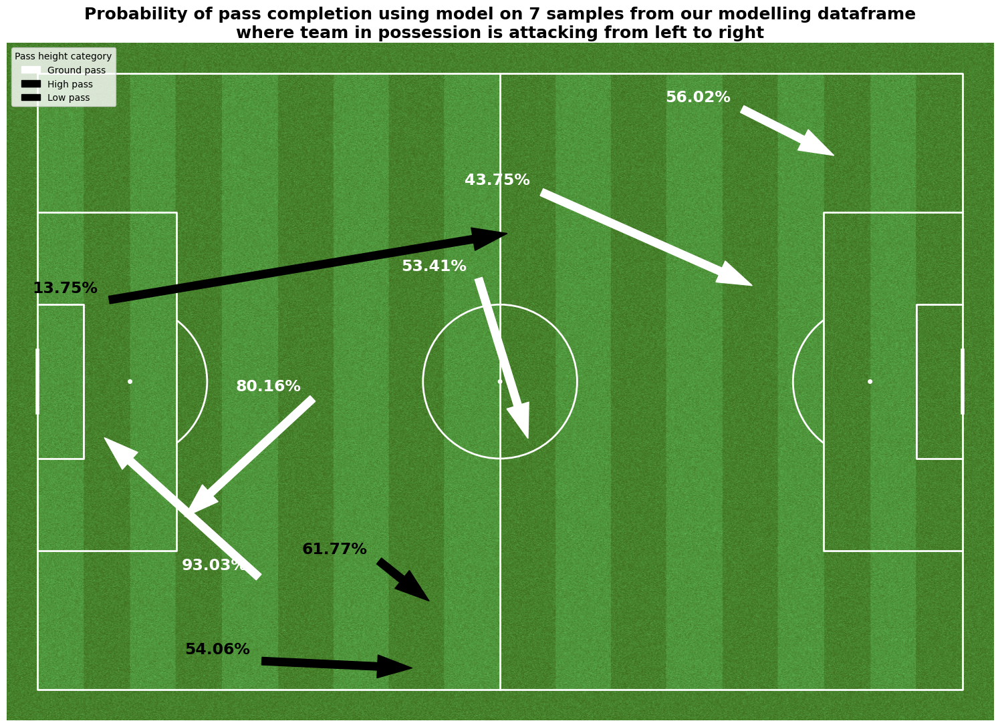

In [36]:
import matplotlib.pyplot as plt
from mplsoccer import Pitch

model = load_model("pass_model.hdf5")
samples = modelling_df.sample(8, random_state=64).reset_index(drop=True)
samples['model_prob_success'] = model.predict(np.array(samples.iloc[:, :-1])).tolist()
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True)
fig, ax = pitch.draw()

fig.set_size_inches(18, 11)
for index, row in samples.iterrows():
    player_x =  row['passing_player_x_location']
    player_y = row['passing_player_y_location']
    ball_end_x = row['pass_end_location_x']
    ball_end_y = row['pass_end_location_y']
    model_prob_success = round(row['model_prob_success'][0]*100, 2)
    #colour = 'white' if row['ground_pass'] == 1 else '#ffffb3' if row['low_pass'] == 1 else 'black'
    colour = "white" if row['completed'] == 1 else "black"
    label = 'Ground pass' if row['ground_pass'] == 1 else 'Low pass' if row['low_pass'] == 1 else 'High pass'
    completed = 1 if row['completed'] ==  1 else 0
    ax.arrow(
        x=player_x, 
        y=player_y, 
        dx=ball_end_x - player_x, 
        dy=ball_end_y - player_y,
        width=1, 
        color=colour,
        label=label,
    )
    ax.annotate(
        f"{model_prob_success}%", 
        xy=(player_x - 10, player_y + 1), 
        color=colour,
        size=17,
        weight='bold'
    )
ax.set_title(
    "Probability of pass completion using model on 7 samples from our modelling dataframe\n"
    "where team in possession is attacking from left to right",
    size=18,
    weight='bold'
)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), title="Pass height category", loc='upper left')
plt.gca().invert_yaxis()
fig.savefig(f"pass_probabilities.png", bbox_inches="tight")
plt.show()

1/1 [==============================] - 0s 189ms/step


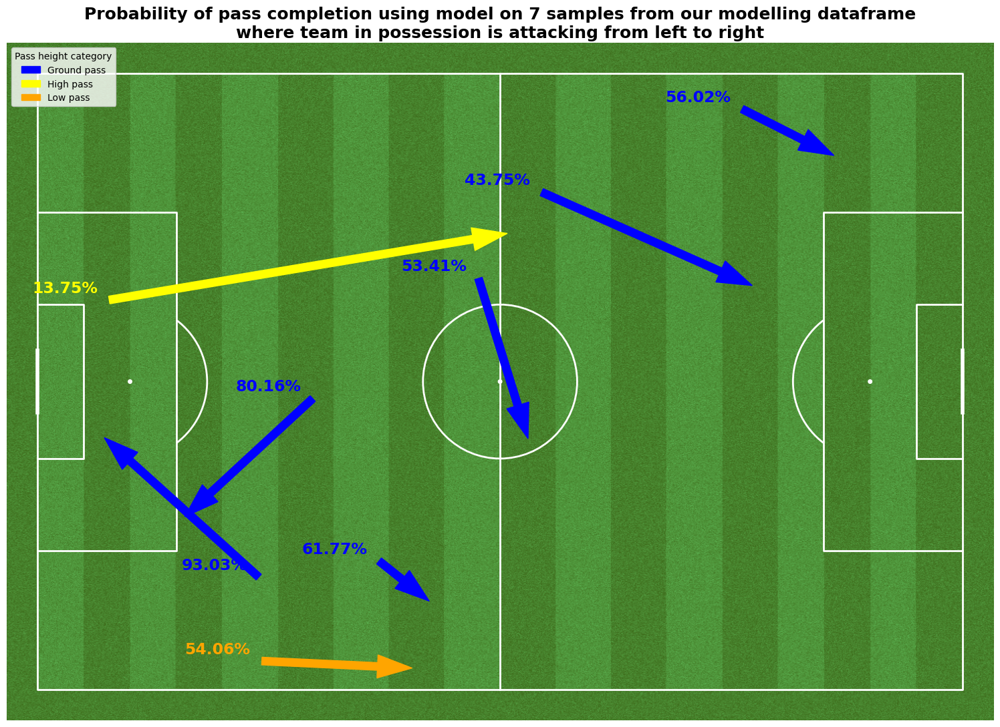

In [38]:
import matplotlib.pyplot as plt
from mplsoccer import Pitch

model = load_model("pass_model.hdf5")
samples = modelling_df.sample(8, random_state=64).reset_index(drop=True)
samples['model_prob_success'] = model.predict(np.array(samples.iloc[:, :-1])).tolist()
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True)
fig, ax = pitch.draw()

fig.set_size_inches(18, 11)
for index, row in samples.iterrows():
    player_x =  row['passing_player_x_location']
    player_y = row['passing_player_y_location']
    ball_end_x = row['pass_end_location_x']
    ball_end_y = row['pass_end_location_y']
    model_prob_success = round(row['model_prob_success'][0]*100, 2)
    colour = 'blue' if row['ground_pass'] == 1 else 'orange' if row['low_pass'] == 1 else 'yellow'
    true_colour = "white" if row['completed'] == 1 else "black"
    label = 'Ground pass' if row['ground_pass'] == 1 else 'Low pass' if row['low_pass'] == 1 else 'High pass'
    completed = 1 if row['completed'] ==  1 else 0
    ax.arrow(
        x=player_x, 
        y=player_y, 
        dx=ball_end_x - player_x, 
        dy=ball_end_y - player_y,
        width=1, 
        color=colour,
        label=label,
    )
    ax.annotate(
        f"{model_prob_success}%", 
        xy=(player_x - 10, player_y + 1), 
        color=true_colour,
        size=17,
        weight='bold'
    )
ax.set_title(
    "Probability of pass completion using model on 7 samples from our modelling dataframe\n"
    "where team in possession is attacking from left to right",
    size=18,
    weight='bold'
)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), title="Pass height category", loc='upper left')
plt.gca().invert_yaxis()
fig.savefig(f"pass_probabilities.png", bbox_inches="tight")
plt.show()

In [89]:
modelling_df.columns

Index(['event_id', 'passing_player_x_location', 'passing_player_y_location',
       'pass_end_location_x', 'pass_end_location_y', 'ground_pass',
       'high_pass', 'low_pass', 'drop_kick', 'head', 'keeper_arm', 'left_foot',
       'no_touch', 'other', 'right_foot', 'completed'],
      dtype='object')

In [96]:
player_df["expected_pass"] = 

0       [0.7406991124153137]
1       [0.6671527624130249]
2       [0.8439467549324036]
3       [0.9513894319534302]
4       [0.7312541604042053]
                ...         
3884    [0.2538847029209137]
3885    [0.5142542123794556]
3886    [0.5301880240440369]
3887    [0.9578315615653992]
3888    [0.8792162537574768]
Name: model_prob_success, Length: 3864, dtype: object

In [15]:
player_df.iloc[:, 1:-1]

,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,ground_pass,high_pass,low_pass,drop_kick,head,keeper_arm,left_foot,no_touch,other,right_foot
0,60.0,40.0,49.8,38.5,1,0,0,0,0,0,0,0,0,1
1,48.4,35.9,40.3,19.0,1,0,0,0,0,0,0,0,0,1
2,39.7,18.7,30.2,22.1,1,0,0,0,0,0,1,0,0,0
3,28.0,25.5,23.5,53.6,1,0,0,0,0,0,1,0,0,0
4,28.7,57.8,26.6,30.5,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3884,4.3,34.4,40.5,31.8,0,1,0,0,0,0,0,0,0,1
3885,82.4,51.1,91.4,53.0,1,0,0,0,0,0,0,0,0,1
3886,90.3,53.4,99.1,58.3,1,0,0,0,0,0,0,0,0,1
3887,7.0,44.1,7.7,58.6,1,0,0,0,0,0,1,0,0,0


In [16]:
player_df = modelling_df

player_df['model_prob_success'] = model.predict(np.array(player_df.iloc[:, 1:-1])).tolist()

player_df['expected_pass'] = player_df['model_prob_success'].apply(lambda x: x[0])

121/121 [==============================] - 0s 984us/step


In [17]:
player_df

,event_id,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,ground_pass,high_pass,low_pass,drop_kick,head,keeper_arm,left_foot,no_touch,other,right_foot,completed,model_prob_success,expected_pass
0,bc23853b-0aa8-42ac-9daa-deefa00d9de2,60.0,40.0,49.8,38.5,1,0,0,0,0,0,0,0,0,1,1,[0.7406991124153137],0.740699
1,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,48.4,35.9,40.3,19.0,1,0,0,0,0,0,0,0,0,1,1,[0.6671527624130249],0.667153
2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,39.7,18.7,30.2,22.1,1,0,0,0,0,0,1,0,0,0,1,[0.8439467549324036],0.843947
3,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,28.0,25.5,23.5,53.6,1,0,0,0,0,0,1,0,0,0,1,[0.9513894319534302],0.951389
4,32629e9e-92ae-4184-abec-bbc050519402,28.7,57.8,26.6,30.5,1,0,0,0,0,0,0,0,0,1,1,[0.7312541604042053],0.731254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3884,224b8270-94fc-46fa-8439-7e8afe6d7e2a,4.3,34.4,40.5,31.8,0,1,0,0,0,0,0,0,0,1,0,[0.2538847029209137],0.253885
3885,1769d59f-1ba9-42b9-9b6c-f902969979a2,82.4,51.1,91.4,53.0,1,0,0,0,0,0,0,0,0,1,1,[0.5142542123794556],0.514254
3886,f58c8eee-27e4-445e-8a38-73c44c9375a3,90.3,53.4,99.1,58.3,1,0,0,0,0,0,0,0,0,1,1,[0.5301880240440369],0.530188
3887,638f857d-41b8-4ff2-a6ef-c08514c17a18,7.0,44.1,7.7,58.6,1,0,0,0,0,0,1,0,0,0,1,[0.9578315615653992],0.957832


In [35]:
asses_pass = pd.merge(pass_df, player_df[['event_id', 'completed', 'expected_pass']], on = "event_id")
asses_pass['Pass_Value'] = asses_pass["completed"] - asses_pass['expected_pass']
asses_pass['time'] = pd.to_datetime(asses_pass['timestamp'])
asses_pass

,match_id,event_id,timestamp,period,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome,completed,expected_pass,Pass_Value,time
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,00:00:00.250,1,Aston Villa,Lucy Staniforth,Rachel Daly,60.0,40.0,49.8,38.5,Ground Pass,Right Foot,None,1,0.740699,0.259301,2023-04-06 00:00:00.250
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,00:00:02.056,1,Aston Villa,Mayumi Pacheco,Lucy Staniforth,48.4,35.9,40.3,19.0,Ground Pass,Right Foot,None,1,0.667153,0.332847,2023-04-06 00:00:02.056
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,00:00:04.507,1,Aston Villa,Danielle Turner,Mayumi Pacheco,39.7,18.7,30.2,22.1,Ground Pass,Left Foot,None,1,0.843947,0.156053,2023-04-06 00:00:04.507
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,00:00:07.681,1,Aston Villa,Anna Patten,Danielle Turner,28.0,25.5,23.5,53.6,Ground Pass,Left Foot,None,1,0.951389,0.048611,2023-04-06 00:00:07.681
4,2,32629e9e-92ae-4184-abec-bbc050519402,00:00:11.728,1,Aston Villa,Danielle Turner,Anna Patten,28.7,57.8,26.6,30.5,Ground Pass,Right Foot,None,1,0.731254,0.268746,2023-04-06 00:00:11.728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3859,4,224b8270-94fc-46fa-8439-7e8afe6d7e2a,00:50:08.269,2,Manchester City WFC,Mary Boio Fowler,Ellie Roebuck,4.3,34.4,40.5,31.8,High Pass,Right Foot,Incomplete,0,0.253885,-0.253885,2023-04-06 00:50:08.269
3860,4,1769d59f-1ba9-42b9-9b6c-f902969979a2,00:50:11.174,2,Tottenham Hotspur Women,Angharad James,So-Hyun Cho,82.4,51.1,91.4,53.0,Ground Pass,Right Foot,None,1,0.514254,0.485746,2023-04-06 00:50:11.174
3861,4,f58c8eee-27e4-445e-8a38-73c44c9375a3,00:50:12.724,2,Tottenham Hotspur Women,Celin Bizet IldhusÃ¸y,Angharad James,90.3,53.4,99.1,58.3,Ground Pass,Right Foot,None,1,0.530188,0.469812,2023-04-06 00:50:12.724
3862,4,638f857d-41b8-4ff2-a6ef-c08514c17a18,00:50:38.836,2,Manchester City WFC,Esme Beth Morgan,Ellie Roebuck,7.0,44.1,7.7,58.6,Ground Pass,Left Foot,None,1,0.957832,0.042168,2023-04-06 00:50:38.836


In [39]:
asses_pass.loc[asses_pass["period"] == 2, "time"] += timedelta(minutes = 45)

In [58]:
asses_pass

,match_id,event_id,timestamp,period,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome,completed,expected_pass,Pass_Value,time
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,00:00:00.250,1,Aston Villa,Lucy Staniforth,Rachel Daly,60.0,40.0,49.8,38.5,Ground Pass,Right Foot,None,1,0.740699,0.259301,2023-04-06 00:00:00.250
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,00:00:02.056,1,Aston Villa,Mayumi Pacheco,Lucy Staniforth,48.4,35.9,40.3,19.0,Ground Pass,Right Foot,None,1,0.667153,0.332847,2023-04-06 00:00:02.056
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,00:00:04.507,1,Aston Villa,Danielle Turner,Mayumi Pacheco,39.7,18.7,30.2,22.1,Ground Pass,Left Foot,None,1,0.843947,0.156053,2023-04-06 00:00:04.507
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,00:00:07.681,1,Aston Villa,Anna Patten,Danielle Turner,28.0,25.5,23.5,53.6,Ground Pass,Left Foot,None,1,0.951389,0.048611,2023-04-06 00:00:07.681
4,2,32629e9e-92ae-4184-abec-bbc050519402,00:00:11.728,1,Aston Villa,Danielle Turner,Anna Patten,28.7,57.8,26.6,30.5,Ground Pass,Right Foot,None,1,0.731254,0.268746,2023-04-06 00:00:11.728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3859,4,224b8270-94fc-46fa-8439-7e8afe6d7e2a,00:50:08.269,2,Manchester City WFC,Mary Boio Fowler,Ellie Roebuck,4.3,34.4,40.5,31.8,High Pass,Right Foot,Incomplete,0,0.253885,-0.253885,2023-04-06 01:35:08.269
3860,4,1769d59f-1ba9-42b9-9b6c-f902969979a2,00:50:11.174,2,Tottenham Hotspur Women,Angharad James,So-Hyun Cho,82.4,51.1,91.4,53.0,Ground Pass,Right Foot,None,1,0.514254,0.485746,2023-04-06 01:35:11.174
3861,4,f58c8eee-27e4-445e-8a38-73c44c9375a3,00:50:12.724,2,Tottenham Hotspur Women,Celin Bizet IldhusÃ¸y,Angharad James,90.3,53.4,99.1,58.3,Ground Pass,Right Foot,None,1,0.530188,0.469812,2023-04-06 01:35:12.724
3862,4,638f857d-41b8-4ff2-a6ef-c08514c17a18,00:50:38.836,2,Manchester City WFC,Esme Beth Morgan,Ellie Roebuck,7.0,44.1,7.7,58.6,Ground Pass,Left Foot,None,1,0.957832,0.042168,2023-04-06 01:35:38.836


In [160]:
asses_pass[asses_pass['passing_team'] == 'Manchester City WFC'].groupby(['match_id','passing_player']).size().sort_values(ascending = False)

match_id  passing_player          
3         Alex Greenwood              111
          Laia Aleixandri LÃ³pez      101
4         Alex Greenwood               96
          Yui Hasegawa                 84
2         Alanna Stephanie Kennedy     79
                                     ... 
4         Amy Turner                    1
1         Emma Wilhelmina Koivisto      1
2         Rachel Daly                   1
1         Mary Boio Fowler              1
3         Danielle Carter               1
Length: 93, dtype: int64

In [161]:
df_greenwood_test = asses_pass[(asses_pass["passing_player"] == "Alex Greenwood") & (asses_pass['match_id'] == 3)]
df_greenwood_test

,match_id,event_id,timestamp,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome,completed,expected_pass,Pass_Value
923,3,1cde9603-4ae0-4e1d-b14f-e899a1fd39d2,00:00:26.976,Manchester City WFC,Leila Ouahabi El Ouahabi,Alex Greenwood,11.5,13.1,18.0,3.4,Ground Pass,Right Foot,None,1,0.703644,0.296356
925,3,2f333d66-d645-42ae-a96e-894064000e2e,00:00:30.341,Manchester City WFC,Laura Coombs,Alex Greenwood,12.6,11.3,25.5,6.4,Ground Pass,Left Foot,None,1,0.669404,0.330596
932,3,99ab6e1a-4f07-483d-abdd-6bb647844831,00:01:16.254,Manchester City WFC,Laia Aleixandri LÃ³pez,Alex Greenwood,18.9,25.2,19.3,53.6,Ground Pass,Left Foot,None,1,0.949362,0.050638
941,3,6344556f-f571-4fd8-8404-b07e90b3deb0,00:01:59.741,Manchester City WFC,Julie Blakstad,Alex Greenwood,11.1,9.5,31.2,3.4,High Pass,Left Foot,None,1,0.326924,0.673076
945,3,f6c2504e-18cc-40a3-9a79-c523708ced32,00:02:07.320,Manchester City WFC,Ellie Roebuck,Alex Greenwood,8.0,12.9,2.0,31.5,Ground Pass,Left Foot,None,1,0.932042,0.067958
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,3,e50aa9ae-f737-4bc1-bf96-a792d4854fc5,00:43:49.324,Manchester City WFC,Ruby Mace,Alex Greenwood,36.8,38.0,49.0,50.2,Ground Pass,Left Foot,None,1,0.870663,0.129337
1992,3,7544f7e8-eaa3-45ef-9d5a-2be363f69688,00:45:16.104,Manchester City WFC,Yui Hasegawa,Alex Greenwood,55.9,39.7,70.8,29.5,Ground Pass,Left Foot,None,1,0.632086,0.367914
1996,3,71cbe453-9e03-4924-8d7c-4178d436be4b,00:46:10.876,Manchester City WFC,None,Alex Greenwood,120.0,80.0,115.1,42.9,High Pass,Left Foot,Incomplete,0,0.376480,-0.376480
2007,3,8d1ae61e-51c3-41e1-85f7-578047dfa7b2,00:48:02.368,Manchester City WFC,Yui Hasegawa,Alex Greenwood,55.4,19.6,69.6,15.6,Low Pass,Left Foot,None,1,0.422010,0.577990


In [162]:
df_greenwood_test['time'] = pd.to_datetime(df_greenwood_test['timestamp'])



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [163]:
df_greenwood_test[["timestamp", "time"]]

,timestamp,time
923,00:00:26.976,2023-04-04 00:00:26.976
925,00:00:30.341,2023-04-04 00:00:30.341
932,00:01:16.254,2023-04-04 00:01:16.254
941,00:01:59.741,2023-04-04 00:01:59.741
945,00:02:07.320,2023-04-04 00:02:07.320
...,...,...
1983,00:43:49.324,2023-04-04 00:43:49.324
1992,00:45:16.104,2023-04-04 00:45:16.104
1996,00:46:10.876,2023-04-04 00:46:10.876
2007,00:48:02.368,2023-04-04 00:48:02.368


<AxesSubplot: xlabel='time', ylabel='Pass_Value'>

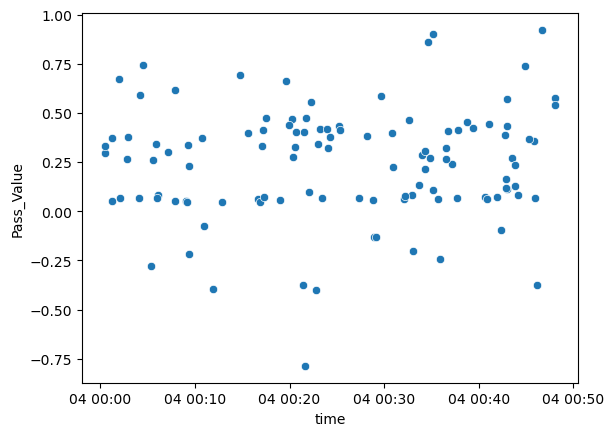

In [164]:
sns.scatterplot(data = df_greenwood_test, x = "time", y = 'Pass_Value')

Text(0.5, 1.0, 'Test')

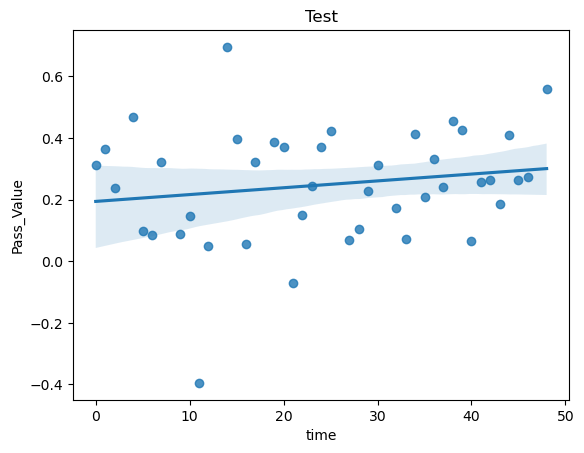

In [183]:
df_rolling_mean_by_minute = df_greenwood_test.groupby(df_greenwood_test.time.dt.minute).Pass_Value.mean().reset_index()

sns.regplot(data = df_rolling_mean_by_minute, x = "time", y = "Pass_Value").set_title("Test")

In [67]:
df_player_match = asses_pass[(asses_pass["passing_player"] == "Alex Greenwood") & 
                                                    (asses_pass['match_id'] == 3)]
df_player_match

,match_id,event_id,timestamp,period,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome,completed,expected_pass,Pass_Value,time
923,3,1cde9603-4ae0-4e1d-b14f-e899a1fd39d2,00:00:26.976,1,Manchester City WFC,Leila Ouahabi El Ouahabi,Alex Greenwood,11.5,13.1,18.0,3.4,Ground Pass,Right Foot,None,1,0.703644,0.296356,2023-04-06 00:00:26.976
925,3,2f333d66-d645-42ae-a96e-894064000e2e,00:00:30.341,1,Manchester City WFC,Laura Coombs,Alex Greenwood,12.6,11.3,25.5,6.4,Ground Pass,Left Foot,None,1,0.669404,0.330596,2023-04-06 00:00:30.341
932,3,99ab6e1a-4f07-483d-abdd-6bb647844831,00:01:16.254,1,Manchester City WFC,Laia Aleixandri LÃ³pez,Alex Greenwood,18.9,25.2,19.3,53.6,Ground Pass,Left Foot,None,1,0.949362,0.050638,2023-04-06 00:01:16.254
941,3,6344556f-f571-4fd8-8404-b07e90b3deb0,00:01:59.741,1,Manchester City WFC,Julie Blakstad,Alex Greenwood,11.1,9.5,31.2,3.4,High Pass,Left Foot,None,1,0.326924,0.673076,2023-04-06 00:01:59.741
945,3,f6c2504e-18cc-40a3-9a79-c523708ced32,00:02:07.320,1,Manchester City WFC,Ellie Roebuck,Alex Greenwood,8.0,12.9,2.0,31.5,Ground Pass,Left Foot,None,1,0.932042,0.067958,2023-04-06 00:02:07.320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,3,e50aa9ae-f737-4bc1-bf96-a792d4854fc5,00:43:49.324,2,Manchester City WFC,Ruby Mace,Alex Greenwood,36.8,38.0,49.0,50.2,Ground Pass,Left Foot,None,1,0.870663,0.129337,2023-04-06 01:28:49.324
1992,3,7544f7e8-eaa3-45ef-9d5a-2be363f69688,00:45:16.104,2,Manchester City WFC,Yui Hasegawa,Alex Greenwood,55.9,39.7,70.8,29.5,Ground Pass,Left Foot,None,1,0.632086,0.367914,2023-04-06 01:30:16.104
1996,3,71cbe453-9e03-4924-8d7c-4178d436be4b,00:46:10.876,2,Manchester City WFC,None,Alex Greenwood,120.0,80.0,115.1,42.9,High Pass,Left Foot,Incomplete,0,0.376480,-0.376480,2023-04-06 01:31:10.876
2007,3,8d1ae61e-51c3-41e1-85f7-578047dfa7b2,00:48:02.368,2,Manchester City WFC,Yui Hasegawa,Alex Greenwood,55.4,19.6,69.6,15.6,Low Pass,Left Foot,None,1,0.422010,0.577990,2023-04-06 01:33:02.368


In [73]:
def draw_trendline_pass_value(player, match_id, by_minute = True):
    df_player_match = asses_pass[(asses_pass["passing_player"] == player) & 
                                                    (asses_pass['match_id'] == match_id)]
    
    if by_minute:
        df_player_match = df_player_match.groupby(df_player_match.time.dt.minute + (df_player_match.time.dt.hour * 60)).Pass_Value.mean().reset_index()
        
    sns.regplot(df_player_match, x = "time", y = "Pass_Value").set(title = "Match id: " + str(match_id) + 
                                                                   " - Player: " + player)
    
    return

In [68]:
df_player_match['time'] = pd.to_datetime(df_player_match['time'])


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [69]:
df_player_match

,match_id,event_id,timestamp,period,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome,completed,expected_pass,Pass_Value,time
923,3,1cde9603-4ae0-4e1d-b14f-e899a1fd39d2,00:00:26.976,1,Manchester City WFC,Leila Ouahabi El Ouahabi,Alex Greenwood,11.5,13.1,18.0,3.4,Ground Pass,Right Foot,None,1,0.703644,0.296356,2023-04-06 00:00:26.976
925,3,2f333d66-d645-42ae-a96e-894064000e2e,00:00:30.341,1,Manchester City WFC,Laura Coombs,Alex Greenwood,12.6,11.3,25.5,6.4,Ground Pass,Left Foot,None,1,0.669404,0.330596,2023-04-06 00:00:30.341
932,3,99ab6e1a-4f07-483d-abdd-6bb647844831,00:01:16.254,1,Manchester City WFC,Laia Aleixandri LÃ³pez,Alex Greenwood,18.9,25.2,19.3,53.6,Ground Pass,Left Foot,None,1,0.949362,0.050638,2023-04-06 00:01:16.254
941,3,6344556f-f571-4fd8-8404-b07e90b3deb0,00:01:59.741,1,Manchester City WFC,Julie Blakstad,Alex Greenwood,11.1,9.5,31.2,3.4,High Pass,Left Foot,None,1,0.326924,0.673076,2023-04-06 00:01:59.741
945,3,f6c2504e-18cc-40a3-9a79-c523708ced32,00:02:07.320,1,Manchester City WFC,Ellie Roebuck,Alex Greenwood,8.0,12.9,2.0,31.5,Ground Pass,Left Foot,None,1,0.932042,0.067958,2023-04-06 00:02:07.320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,3,e50aa9ae-f737-4bc1-bf96-a792d4854fc5,00:43:49.324,2,Manchester City WFC,Ruby Mace,Alex Greenwood,36.8,38.0,49.0,50.2,Ground Pass,Left Foot,None,1,0.870663,0.129337,2023-04-06 01:28:49.324
1992,3,7544f7e8-eaa3-45ef-9d5a-2be363f69688,00:45:16.104,2,Manchester City WFC,Yui Hasegawa,Alex Greenwood,55.9,39.7,70.8,29.5,Ground Pass,Left Foot,None,1,0.632086,0.367914,2023-04-06 01:30:16.104
1996,3,71cbe453-9e03-4924-8d7c-4178d436be4b,00:46:10.876,2,Manchester City WFC,None,Alex Greenwood,120.0,80.0,115.1,42.9,High Pass,Left Foot,Incomplete,0,0.376480,-0.376480,2023-04-06 01:31:10.876
2007,3,8d1ae61e-51c3-41e1-85f7-578047dfa7b2,00:48:02.368,2,Manchester City WFC,Yui Hasegawa,Alex Greenwood,55.4,19.6,69.6,15.6,Low Pass,Left Foot,None,1,0.422010,0.577990,2023-04-06 01:33:02.368


In [71]:
df_player_match.time.dt.minute + (df_player_match.time.dt.hour * 60)

923      0
925      0
932      1
941      1
945      2
        ..
1983    88
1992    90
1996    91
2007    93
2009    93
Name: time, Length: 112, dtype: int64

[Text(0.5, 1.0, 'Match id:  - Player: ')]

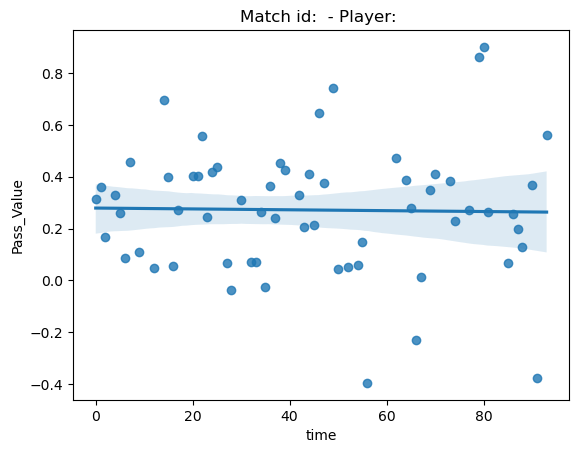

In [72]:
df_player_match = df_player_match.groupby(df_player_match.time.dt.minute + (df_player_match.time.dt.hour * 60)).Pass_Value.mean().reset_index()
sns.regplot(df_player_match, x = "time", y = "Pass_Value").set(title = "Match id: "  + 
                                                                   " - Player: " )

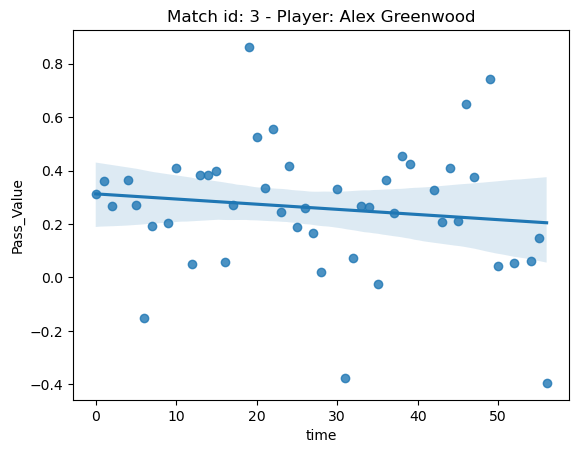

In [44]:
draw_trendline_pass_value("Alex Greenwood", match_id = 3)

In [180]:
pass_df

,match_id,event_id,timestamp,passing_team,recipient_name,passing_player,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,pass_height_category,body_part,outcome
0,2,bc23853b-0aa8-42ac-9daa-deefa00d9de2,00:00:00.250,Aston Villa,Lucy Staniforth,Rachel Daly,60.0,40.0,49.8,38.5,Ground Pass,Right Foot,None
1,2,1fe69497-98e8-4d4f-84c2-4ec034eb97ec,00:00:02.056,Aston Villa,Mayumi Pacheco,Lucy Staniforth,48.4,35.9,40.3,19.0,Ground Pass,Right Foot,None
2,2,13549a51-9ecd-4bdb-94fd-c4982c1fded6,00:00:04.507,Aston Villa,Danielle Turner,Mayumi Pacheco,39.7,18.7,30.2,22.1,Ground Pass,Left Foot,None
3,2,711c01d2-7bdb-4a2f-bf3c-a5a0baa809d5,00:00:07.681,Aston Villa,Anna Patten,Danielle Turner,28.0,25.5,23.5,53.6,Ground Pass,Left Foot,None
4,2,32629e9e-92ae-4184-abec-bbc050519402,00:00:11.728,Aston Villa,Danielle Turner,Anna Patten,28.7,57.8,26.6,30.5,Ground Pass,Right Foot,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3885,4,1769d59f-1ba9-42b9-9b6c-f902969979a2,00:50:11.174,Tottenham Hotspur Women,Angharad James,So-Hyun Cho,82.4,51.1,91.4,53.0,Ground Pass,Right Foot,None
3886,4,f58c8eee-27e4-445e-8a38-73c44c9375a3,00:50:12.724,Tottenham Hotspur Women,Celin Bizet IldhusÃ¸y,Angharad James,90.3,53.4,99.1,58.3,Ground Pass,Right Foot,None
3887,4,638f857d-41b8-4ff2-a6ef-c08514c17a18,00:50:38.836,Manchester City WFC,Esme Beth Morgan,Ellie Roebuck,7.0,44.1,7.7,58.6,Ground Pass,Left Foot,None
3888,4,c33b1ed4-5f74-4058-b0cc-140feaba7c06,00:50:40.943,Manchester City WFC,Ellie Roebuck,Esme Beth Morgan,9.9,58.6,5.0,45.5,Ground Pass,Right Foot,None


In [181]:
np.unique(pass_df[pass_df["passing_team"] == "Manchester City WFC"].passing_player)

array(['Alanna Stephanie Kennedy', 'Alex Greenwood', 'Amy Turner',
       'Angharad James', 'Anna Jessica Leat', 'Anna Patten',
       'Ashleigh Neville', 'Chloe Kelly', 'Danielle Carter',
       'Danielle Turner', 'Demi Stokes',
       'Deyna Cristina Castellanos Naujenis', 'Drew Spence',
       'Ellie Roebuck', 'Emma Wilhelmina Koivisto', 'Esme Beth Morgan',
       'Geum-Min Lee', 'Hayley Emma Raso', 'Ingrid Filippa Angeldal',
       'Jasmine Matthews', 'Jordan Nobbs', 'Jorja Fox',
       'Julia Zigiotti-Olme', 'Julie Blakstad', 'Katie Robinson',
       'Katie Stengel', 'Kayleigh Green', 'Kenza Dali',
       'Kerstin Yasmijn Casparij', 'Kerys Harrop', 'Khadija Monifa Shaw',
       'Laia Aleixandri LÃ³pez', 'Laura Coombs', 'Lauren Hemp',
       'Leila Ouahabi El Ouahabi', 'Lucy Staniforth', 'Mana Iwabuchi',
       'Mary Boio Fowler', 'Mayumi Pacheco', 'Megan Campbell',
       'Megan Connolly', 'Megan Walsh', 'Melissa Lawley',
       'Missy Bo Kearns', 'Molly Bartrip', 'Niamh Fahey',
 

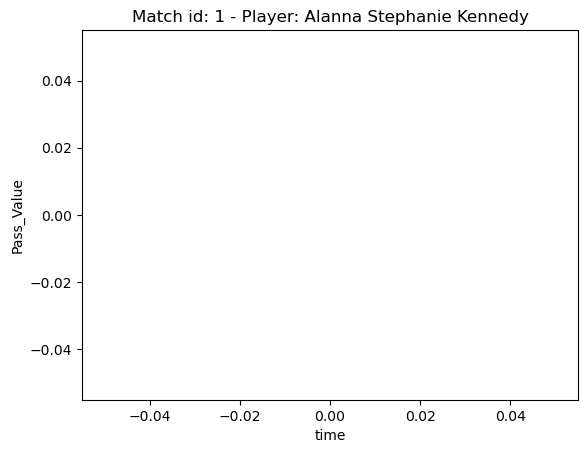

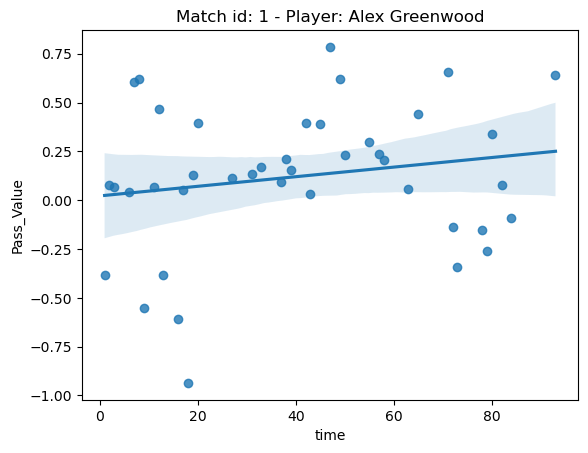

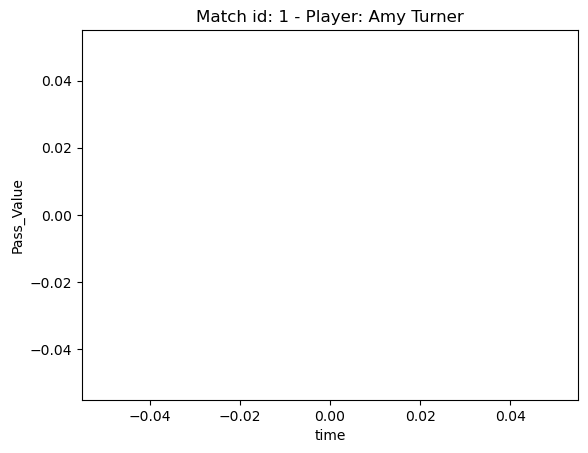

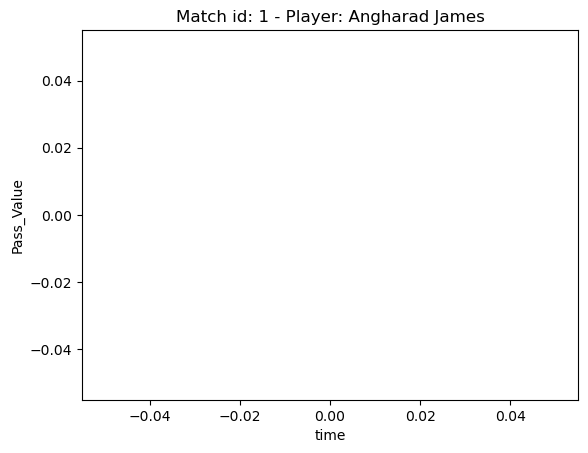

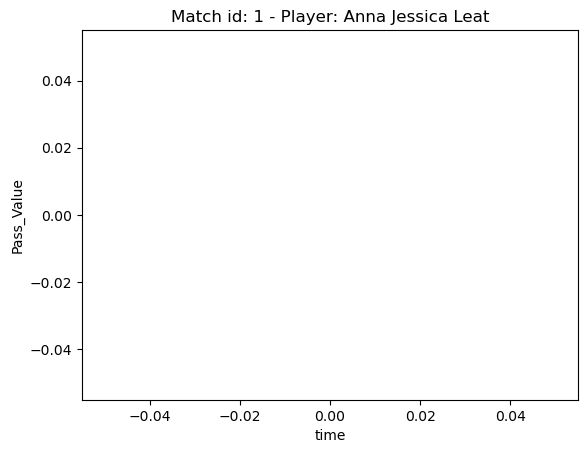

...

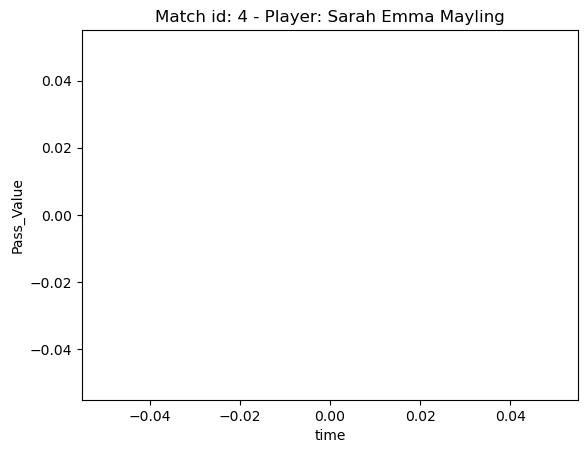

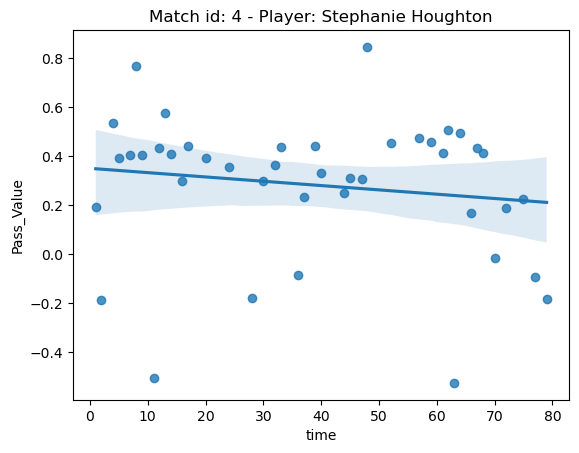

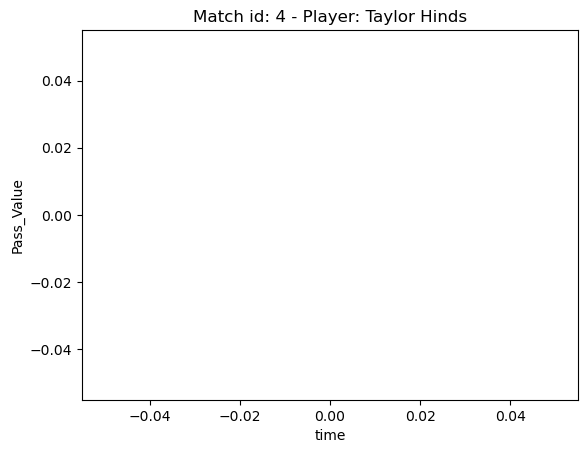

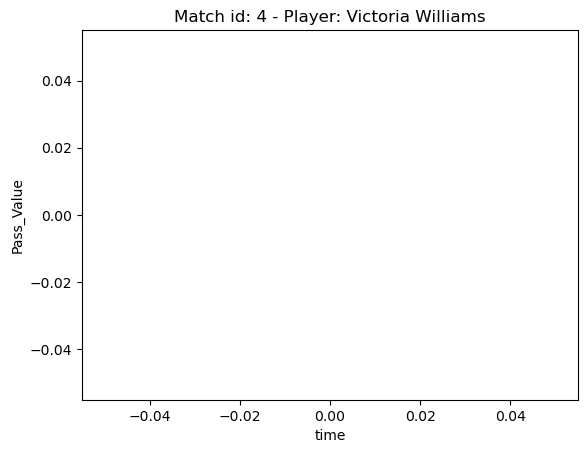

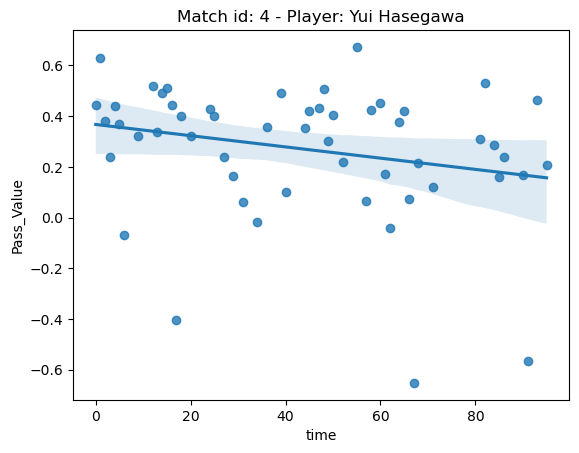

In [74]:
for id in np.unique(pass_df.match_id):
    for ath in np.unique(pass_df[pass_df["passing_team"] == "Manchester City WFC"].passing_player):
        draw_trendline_pass_value(ath, match_id = id)
        plt.show()

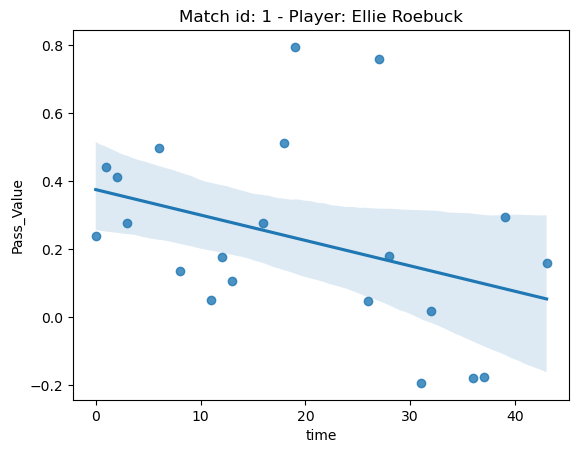

In [25]:
draw_trendline_pass_value("Ellie Roebuck", match_id = 1)

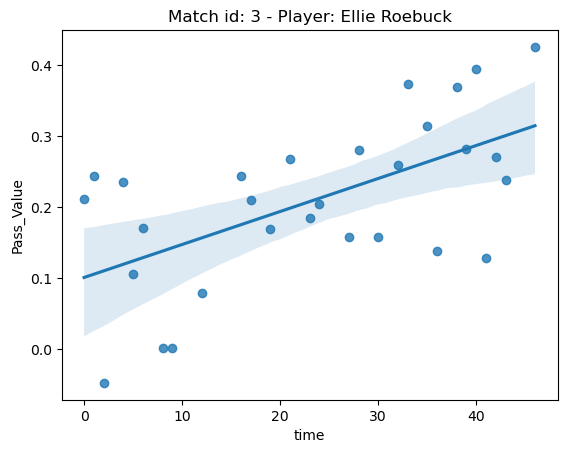

In [26]:
draw_trendline_pass_value("Ellie Roebuck", match_id = 3)

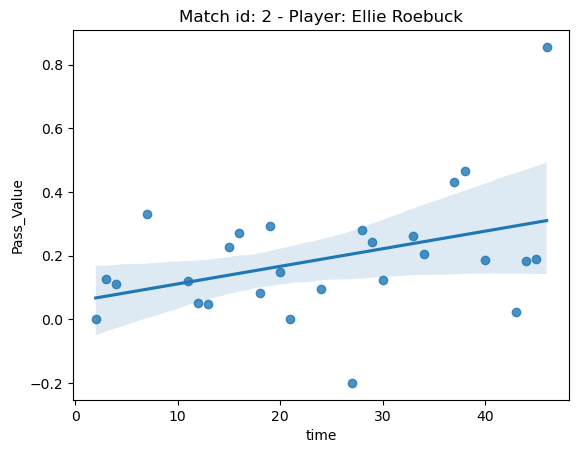

In [28]:
draw_trendline_pass_value("Ellie Roebuck", match_id = 2)

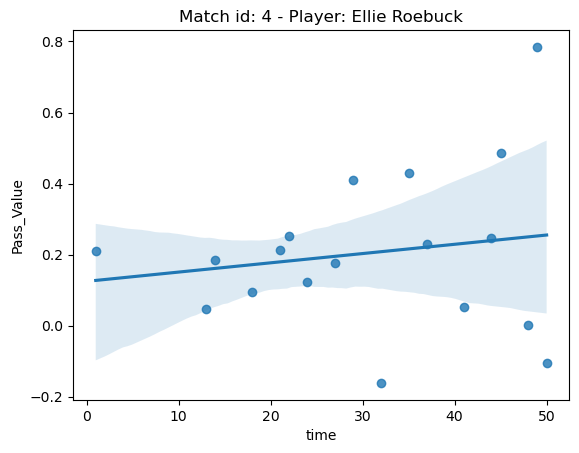

In [29]:
draw_trendline_pass_value("Ellie Roebuck", match_id = 4)

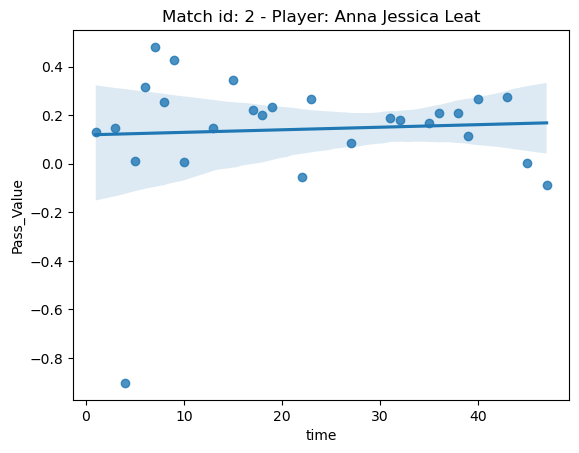

In [27]:
draw_trendline_pass_value("Anna Jessica Leat", match_id = 2)

In [54]:
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

Permutation explainer: 2320it [08:53,  4.33it/s]                                                                                                          


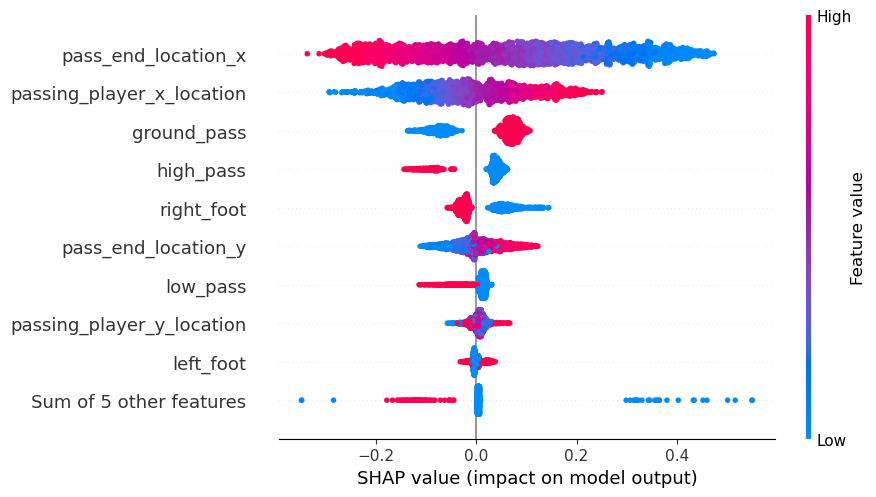

In [64]:
shap.plots.beeswarm(shap_values)

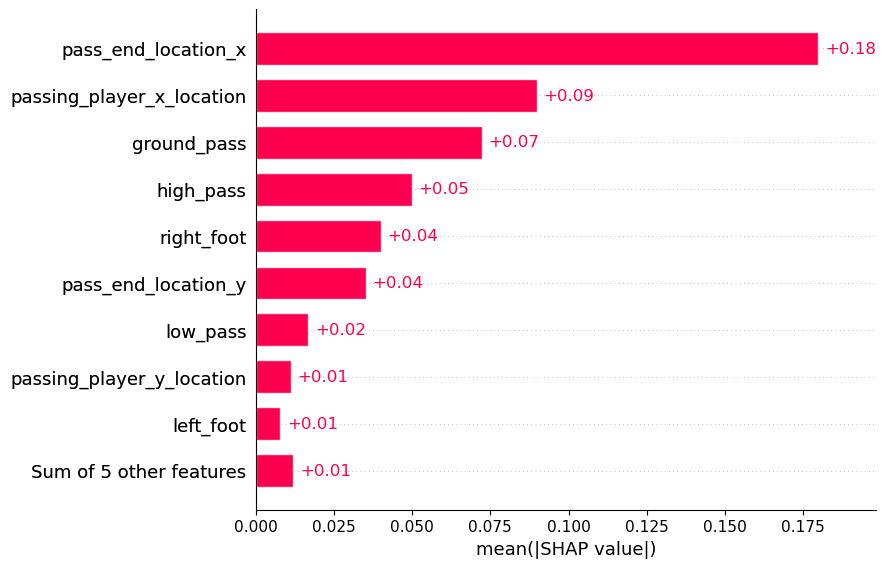

In [65]:
shap.plots.bar(shap_values)

In [61]:
shap_values

.values =
array([[-0.1692758 , -0.00813861,  0.42753634, ...,  0.        ,
         0.        , -0.01833442],
       [-0.09422833, -0.01233167,  0.06333177, ...,  0.        ,
         0.        , -0.03950514],
       [-0.00984709,  0.00492529,  0.0552698 , ...,  0.        ,
         0.        , -0.0417154 ],
       ...,
       [-0.0313016 , -0.02190836,  0.01022207, ...,  0.        ,
         0.        , -0.04163698],
       [ 0.02678536,  0.0130739 ,  0.12237581, ...,  0.        ,
         0.        , -0.02395577],
       [-0.00559113, -0.00588163,  0.08088073, ...,  0.        ,
         0.        , -0.03446696]])

.base_values =
array([[0.46963292],
       [0.46963292],
       [0.46963292],
       ...,
       [0.46963292],
       [0.46963292],
       [0.46963292]])

.data =
array([[ 3.1, 54.3,  7.3, ...,  0. ,  0. ,  1. ],
       [37.7, 57. , 57.1, ...,  0. ,  0. ,  1. ],
       [54.5, 38.7, 55.8, ...,  0. ,  0. ,  1. ],
       ...,
       [50.3, 73.7, 65.3, ...,  0. ,  0. ,  1. ],
 

In [50]:
shap_values = explainer.shap_values(X_train.iloc[20,:], nsamples=500)
# Waterfall plot for first observation
shap.plots.waterfall(shap_values[0])

AttributeError: 'numpy.ndarray' object has no attribute 'base_values'

In [35]:
samples

,passing_player_x_location,passing_player_y_location,pass_end_location_x,pass_end_location_y,ground_pass,high_pass,low_pass,drop_kick,head,keeper_arm,left_foot,no_touch,other,right_foot,completed,model_prob_success
0,91.4,75.4,99.3,71.4,1,0,0,0,0,0,0,0,0,1,1,[0.5602022409439087]
1,9.3,50.6,56.5,58.5,0,1,0,0,0,0,0,0,0,1,0,[0.137471541762352]
2,65.4,64.6,88.6,54.3,1,0,0,0,0,0,0,0,0,1,1,[0.4375405013561249]
3,44.3,16.7,47.3,14.3,1,0,0,0,0,0,0,0,0,1,0,[0.6176570057868958]
4,29.1,3.7,44.1,3.0,0,0,1,0,0,0,1,0,0,0,0,[0.540560781955719]
5,57.2,53.4,62.3,36.9,1,0,0,0,0,0,0,0,0,1,1,[0.5340756177902222]
6,28.7,14.6,12.0,29.7,1,0,0,0,0,0,1,0,0,0,1,[0.9303149580955505]
7,35.7,37.8,22.4,25.5,1,0,0,0,0,0,0,0,0,1,1,[0.801551878452301]
